In [89]:
# Import necessary libraries
import pandas as pd  # Data manipulation library
import numpy as np   # Numerical operations library
import matplotlib.pyplot as plt  # Plotting library
import seaborn as sns  # Statistical data visualization library
import os  # Operating system dependent functionality library
import random  # Random number generation library
from skimage import io  # Image input/output library
import tensorflow as tf  # Machine learning library
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix, roc_curve, auc  # Evaluation metrics
from datetime import datetime  # Date and time library
from keras.preprocessing import image  # Image preprocessing library
from skimage.segmentation import mark_boundaries  # Image segmentation library
from lime import lime_image  # Interpretability library
from PIL import ImageEnhance, Image  # Python Imaging Library
from pathlib import Path  # Object-oriented interface for file system paths
# Load specific modules from TensorFlow and Keras
from tensorflow.keras.models import load_model  # Model loading
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Image data augmentation



In [40]:
# Base directory path
DIR = '../Input/satellite-images-of-hurricane-damage/'

# Create complete paths for different subsets
train_path = os.path.join(DIR, 'train_another')
val_path = os.path.join(DIR, 'validation_another')
test_path = os.path.join(DIR, 'test')
test_another_path = os.path.join(DIR, 'test_another')

## Loading Balanced Test Data With and Without Shuffle

In [122]:
# load test data
image_size = (128, 128)
batch_size = 32

# specify test image transformations (rescale only)
test_datagen = ImageDataGenerator(rescale=1./255)

# test images, with shuffle
test_generator = test_datagen.flow_from_directory(
        test_path,
        target_size=image_size,
        batch_size=batch_size,
        class_mode='binary')

#test images, no shuffle (so results can be matched to image filenames)
test_generator_noshuff = test_datagen.flow_from_directory(
        test_path,
        target_size=image_size,
        batch_size=batch_size,
        shuffle=False,
        class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


# Investigate Misclassifications

In [59]:
def find_missclassed_images(model,data):
    '''Given a model, returns a dataframe of misclassified images and confusion matrix
    
    Args:
    - model: The trained model for which misclassifications need to be identified
    
    Returns:
    - misslabelled: DataFrame containing information about misclassified images
    - y_true: True labels of the test data
    - y_pred: Predicted labels by the model
    '''
    
    # Get true labels and predictions
    true_labels = data.classes
    predictions = best_model.predict(data, verbose=1)
    
    # Switching labels to be more intuitive (if needed)
    y_true = np.array([1 if x == 0 else 0 for x in true_labels])
    pred_interim = [np.argmax(x) for x in predictions]
    y_pred = np.array([1 if x == 0 else 0 for x in pred_interim])
    
    # Get filenames, create DataFrame from the dictionary
    filenames = data.filenames
    df_dict = {'filenames': filenames, 'true_label': y_true, 'pred_label': y_pred}
    df = pd.DataFrame(df_dict)
    
    # Identify misclassified images
    misslabelled = df[df['true_label'] != df['pred_label']]
    
    return misslabelled, y_true, y_pred


## Best Model Performance On No-Shuffled Test Data

63/63 [==============================] - 2s 23ms/step


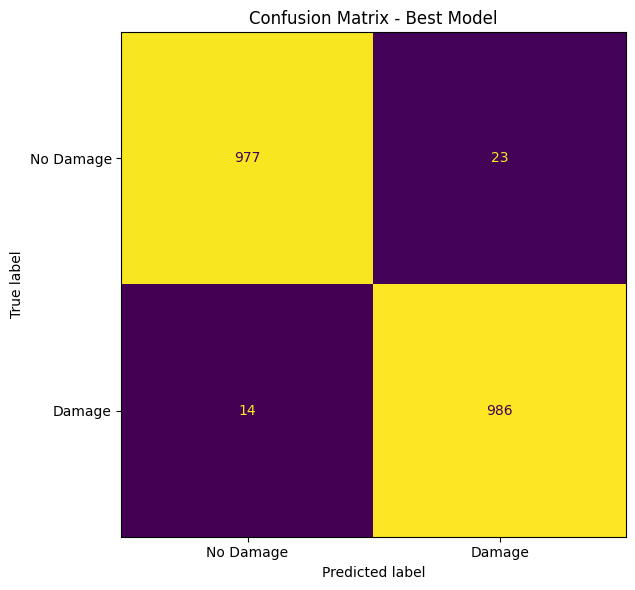

In [209]:
# Load multiple models
model_paths = ['models/Model3/best_model_test_5.keras']

# Create a list to store results
results_list = []

# Plot confusion matrices in a single subplot
num_models = len(model_paths)

fig, axs = plt.subplots(1, num_models, figsize=(12 * num_models, 6))

if num_models == 1:
    axs = [axs]  # Wrap the single Axes object in a list for consistent indexing

for i, model_path in enumerate(model_paths):
    best_model = load_model(model_path)
    eval_results = best_model.evaluate(x=test_generator, verbose=1)
    missclass_df, true, pred = find_missclassed_images(best_model,test_generator_noshuff)
    
    # Append results to the list
    results_list.append({
        'Model': model_path,
        'Confusion Matrix': confusion_matrix(true, pred),
        'Misclassified Images': missclass_df
    })
    
    # Plot confusion matrix in the corresponding subplot
    ax = axs[i]
    
    cm = confusion_matrix(true, pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Damage', 'Damage'])
    
    # Plot the confusion matrix
    disp.plot(ax=ax, values_format='d', colorbar=False)
    ax.set_title(f"Confusion Matrix - Best Model")

# Adjust layout
plt.tight_layout()
plt.show()


## Plotting Misclassified Images

In [127]:
# Function to plot misclassified images
def plot_misclassified_images(missclass_df, DIR):
    num_images = min(len(missclass_df), 9)  # Limit to 6 images for better visualization
    num_cols = 3
    num_rows = num_images // num_cols + (num_images % num_cols > 0)
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 6 * num_rows))
    
    for i in range(num_images):
        img_path = os.path.join(DIR, missclass_df.iloc[i]['filenames'])
        img = plt.imread(img_path)
        
        ax = axes[i // num_cols, i % num_cols] if num_rows > 1 else axes[i % num_cols]
        ax.imshow(img)
        ax.set_title(f"True: {missclass_df.iloc[i]['true_label']}, Predicted: {missclass_df.iloc[i]['pred_label']}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

Model 1 - models/Model3/best_model_test_5.keras


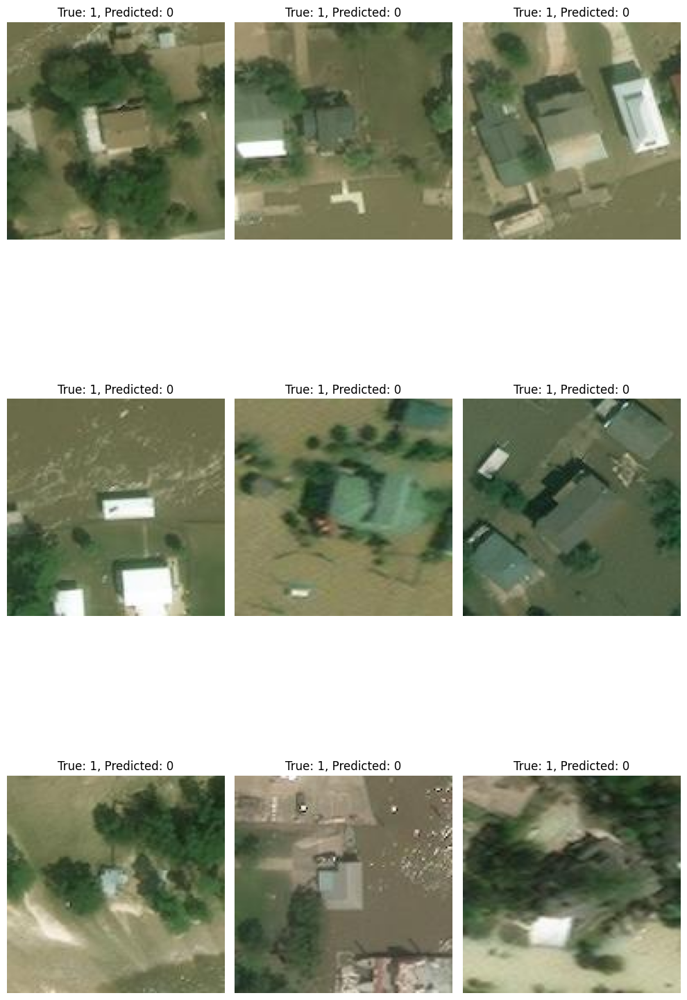

In [128]:
# Plot misclassified images for each model
for i, result in enumerate(results_list):
    print(f"Model {i + 1} - {result['Model']}")
    plot_misclassified_images(result['Misclassified Images'], test_path)

# Plot Confusion Matrix and ROC Curve

63/63 [==============================] - 1s 23ms/step


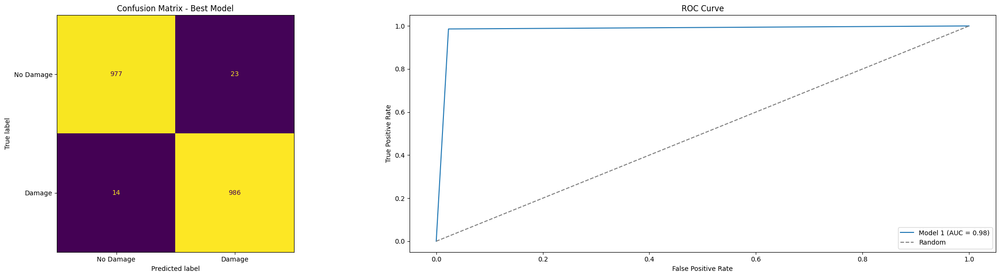

In [134]:

# Load multiple models
model_paths = ['models/Model3/best_model_test_5.keras']

# Plot confusion matrices and ROC curves in a single subplot
num_models = len(model_paths)

fig, axs = plt.subplots(1, num_models + 1, figsize=(12 * (num_models + 1), 6))

if num_models == 1:
    axs = [axs]  # Wrap the single Axes object in a list for consistent indexing

for i, model_path in enumerate(model_paths):
    best_model = load_model(model_path)
    eval_results = best_model.evaluate(x=test_generator, verbose=1)
    missclass_df, true, pred = find_missclassed_images(best_model,test_generator_noshuff)
    
    # Append results to the list
    results_list.append({
        'Model': model_path,
        'Confusion Matrix': confusion_matrix(true, pred),
        'Misclassified Images': missclass_df
    })
    
    # Plot confusion matrix in the corresponding subplot
    ax = axs[0][i]
    
    cm = confusion_matrix(true, pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Damage', 'Damage'])
    
    # Plot the confusion matrix
    disp.plot(ax=ax, values_format='d', colorbar=False)
    ax.set_title(f"Confusion Matrix - Best Model")

    # Plot ROC curve in a new subplot
    ax_roc = axs[0][num_models]
    fpr, tpr, _ = roc_curve(true, pred)
    roc_auc = auc(fpr, tpr)
    
    ax_roc.plot(fpr, tpr, label=f'Model {i + 1} (AUC = {roc_auc:.2f})')
    ax_roc.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
    ax_roc.set_xlabel('False Positive Rate')
    ax_roc.set_ylabel('True Positive Rate')
    ax_roc.set_title('ROC Curve')
    ax_roc.legend()

# Adjust layout
plt.tight_layout()
plt.show()


# Test Model 5 as Best Model

In [135]:
# load best performing model
best_model = load_model('models/Model3/best_model_test_5.keras')

In [136]:
# Function to plot images with actual and predicted labels
def plot_images_with_predictions(model, data_generator, num_images=5):
    # Get an iterator for the dataset
    iterator = iter(data_generator)

    try:
        # Get a batch of images and labels from the iterator
        batch = next(iterator)
        images, labels = batch

        # Make predictions using the trained model
        predictions = model.predict(images)

        # Check if labels are one-dimensional
        if len(labels.shape) == 1:
            actual_labels = labels
        else:
            # Convert one-hot encoded labels to class labels
            actual_labels = np.argmax(labels, axis=1)

        # Convert predicted probabilities to class labels
        predicted_labels = np.argmax(predictions, axis=1)

        # Plot images with actual and predicted labels
        plt.figure(figsize=(15, 8))
        for i in range(num_images):
            # Clip pixel values to the valid range [0, 1]
            clipped_image = np.clip(images[i], 0, 1)

            plt.subplot(2, num_images, i + 1)
            plt.imshow(clipped_image)
            plt.title(f"Actual: {actual_labels[i]}")

            plt.subplot(2, num_images, num_images + i + 1)
            plt.imshow(clipped_image)
            plt.title(f"Predicted: {predicted_labels[i]}")

        plt.show()

    except StopIteration:
        print("End of iterator. No more batches to plot.")

1/1 [==============================] - 0s 101ms/step


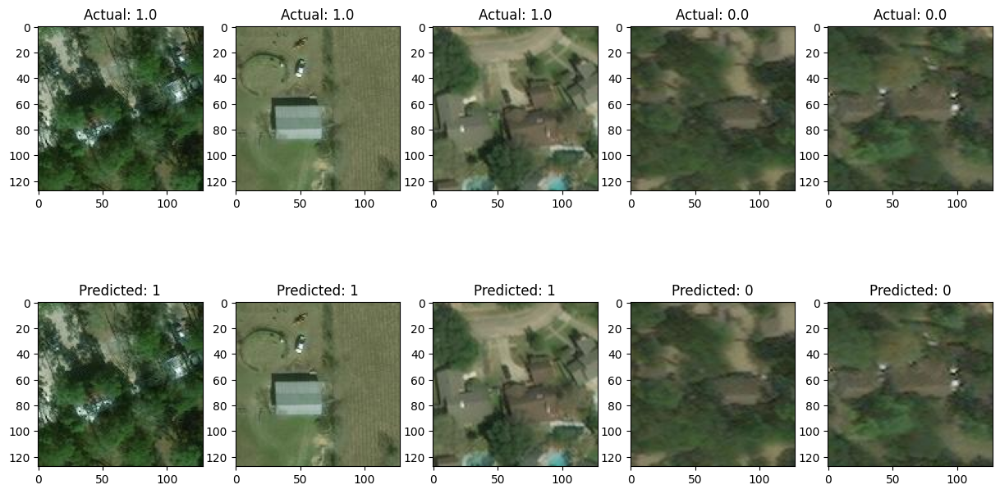

In [137]:
# Plot images and predictions
plot_images_with_predictions(best_model, test_generator, num_images=5)

In [139]:
# Evaluate the model
eval_results = best_model.evaluate(x=test_generator, verbose=1)
missclass_df, true, pred = find_missclassed_images(best_model,test_generator_noshuff)

# Calculate metrics
accuracy = accuracy_score(true, pred)
precision = precision_score(true, pred)
recall = recall_score(true, pred)
true_positive_rate = recall_score(true, pred)
false_positive_rate = confusion_matrix(true, pred)[0, 1] / (confusion_matrix(true, pred)[0, 1] + confusion_matrix(true, pred)[0, 0])

# Print or use the results as needed
print(f"\nModel: {model_path}")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"True Positive Rate (Sensitivity): {true_positive_rate:.4f}")
print(f"False Positive Rate: {false_positive_rate:.4f}")


63/63 [==============================] - 2s 24ms/step

Model: models/Model3/best_model_test_5.keras
Accuracy: 0.9815
Precision: 0.9772
Recall: 0.9860
True Positive Rate (Sensitivity): 0.9860
False Positive Rate: 0.0230


# Plot Missclassified Images

In [140]:
# false positive (ie pred=damage(1), true=no damage(0))
fp_list = list(missclass_df[missclass_df.pred_label==1].filenames)

# false negative (ie pred=no damage (0), true=damage(1))
fn_list = list(missclass_df[missclass_df.pred_label==0].filenames)

In [141]:
def create_image_list(filename_list):
    images_list = []
    for filename in filename_list:
        #load  image
        tile_path = os.path.join(DIR, 'test', filename)
        tile = io.imread(tile_path)
        #add image array to list
        images_list.append(tile)
        
    return images_list

In [142]:
# generate lists of FN/FN image arrays
fp_img_list = create_image_list(fp_list)
fn_img_list = create_image_list(fn_list)

In [143]:
def plot_img_matrix(images_list, rows, columns):

    '''Given a list of image arrays, plot them as tiles in a single figure'''
    f, axarr = plt.subplots(rows,columns, figsize=(columns*2,rows*2))
    img_idx = 0

    for row_idx in range(rows):
        for col_idx in range(columns):

            axarr[row_idx,col_idx].imshow(images_list[img_idx])
            axarr[row_idx,col_idx].axis('off')
            img_idx +=1

    plt.show()

# False Negatives

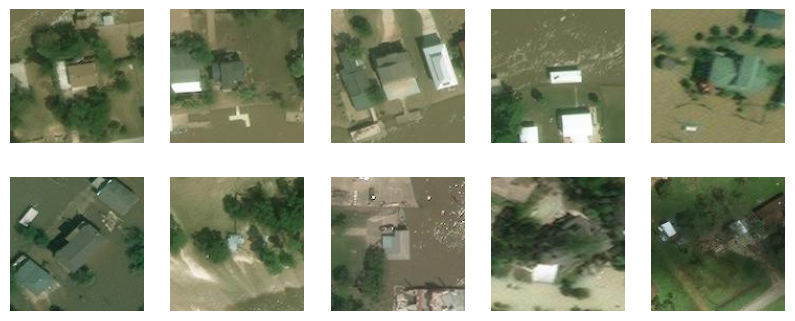

In [144]:
# plot false negative images (predicted as )
plot_img_matrix(fn_img_list, 2, 5)

# False Positives

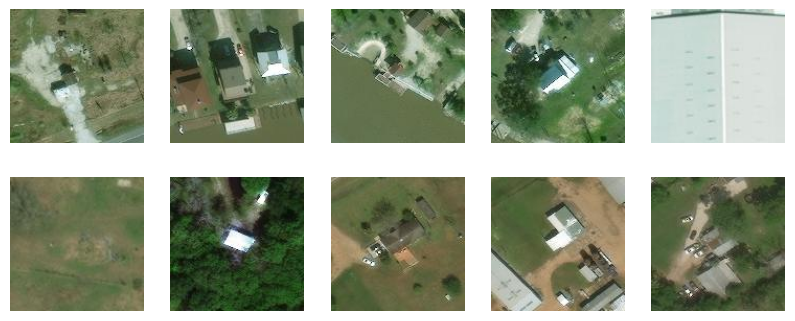

In [145]:
# plot false positive images
plot_img_matrix(fp_img_list, 2, 5)

In [146]:
best_model.summary()

Model: "model_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_29 (InputLayer)       [(None, 128, 128, 3)]     0         
                                                                 
 conv2d_72 (Conv2D)          (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d_53 (MaxPooli  (None, 64, 64, 32)        0         
 ng2D)                                                           
                                                                 
 batch_normalization_45 (Ba  (None, 64, 64, 32)        128       
 tchNormalization)                                               
                                                                 
 activation_45 (Activation)  (None, 64, 64, 32)        0         
                                                                 
 conv2d_73 (Conv2D)          (None, 32, 32, 64)        184

# Explainability

In [147]:
#!pip install lime

def color_count_feature(raw_image):
    return best_model.predict(np.expand_dims(raw_image, 0))[0]

In [148]:

# Create a DataFrame with the paths of JPEG and JPG files in the specified directory and its subdirectories
image_df = pd.DataFrame({'path': list(Path(DIR).glob('**/*.jp*g'))})


# Extract the 'damage' label from the parent directory of each image
image_df['damage'] = image_df['path'].map(lambda x: x.parent.stem)

# Extract the 'data_split' label from the parent's parent directory of each image
image_df['data_split'] = image_df['path'].map(lambda x: x.parent.parent.stem)

# Extract the 'location' label from the filename stem of each image
image_df['location'] = image_df['path'].map(lambda x: x.stem)

# Extract the longitude and latitude from the 'location' label and create separate 'lon' and 'lat' columns
image_df['lon'] = image_df['location'].map(lambda x: float(x.split('_')[0]))
image_df['lat'] = image_df['location'].map(lambda x: float(x.split('_')[-1]))

# Convert the 'path' column back to a string representation of the Path object
image_df['path'] = image_df['path'].map(lambda x: str(x))

# Display the first few rows of the DataFrame
image_df.head()

,path,damage,data_split,location,lon,lat
0,../Input/satellite-images-of-hurricane-damage/...,no_damage,test,-95.63609699999999_29.843807,-95.636097,29.843807
1,../Input/satellite-images-of-hurricane-damage/...,no_damage,test,-95.237647_29.559739,-95.237647,29.559739
2,../Input/satellite-images-of-hurricane-damage/...,no_damage,test,-95.63993599999999_29.837821,-95.639936,29.837821
3,../Input/satellite-images-of-hurricane-damage/...,no_damage,test,-95.64638599999999_29.832628000000003,-95.646386,29.832628
4,../Input/satellite-images-of-hurricane-damage/...,no_damage,test,-95.631831_29.849646999999997,-95.631831,29.849647


In [149]:
sample_images_df = image_df.query('data_split=="test"').groupby('damage').apply(lambda x: x.sample(3)).reset_index(drop=True)

['../Input/satellite-images-of-hurricane-damage/test/no_damage/-95.072436_30.02982.jpeg', '../Input/satellite-images-of-hurricane-damage/test/no_damage/-95.07696700000001_29.826773.jpeg', '../Input/satellite-images-of-hurricane-damage/test/no_damage/-95.095552_29.834027000000003.jpeg', '../Input/satellite-images-of-hurricane-damage/test/no_damage/-95.095933_29.834575.jpeg', '../Input/satellite-images-of-hurricane-damage/test/no_damage/-95.640883_29.818303000000004.jpeg', '../Input/satellite-images-of-hurricane-damage/test/no_damage/-95.66005899999999_29.829753000000004.jpeg', '../Input/satellite-images-of-hurricane-damage/test/no_damage/-96.934568_28.496004.jpeg', '../Input/satellite-images-of-hurricane-damage/test/no_damage/-96.938227_28.765045.jpeg', '../Input/satellite-images-of-hurricane-damage/test/no_damage/-96.93964100000001_28.764159000000003.jpeg', '../Input/satellite-images-of-hurricane-damage/test/no_damage/-96.941006_28.710897999999997.jpeg', '../Input/satellite-images-of-h

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 14ms/step


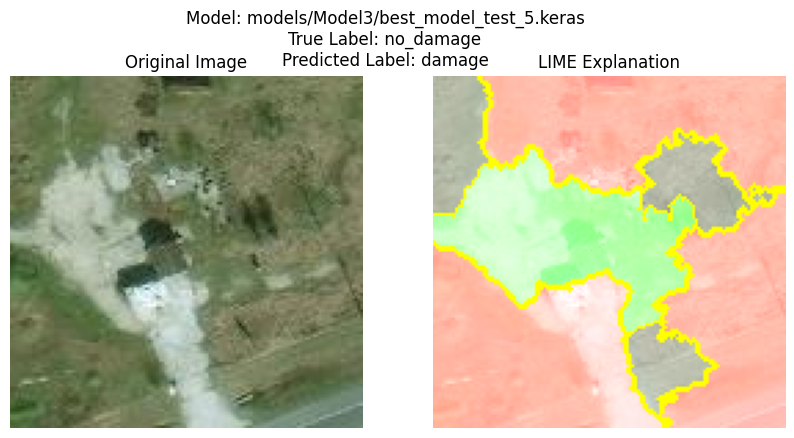

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


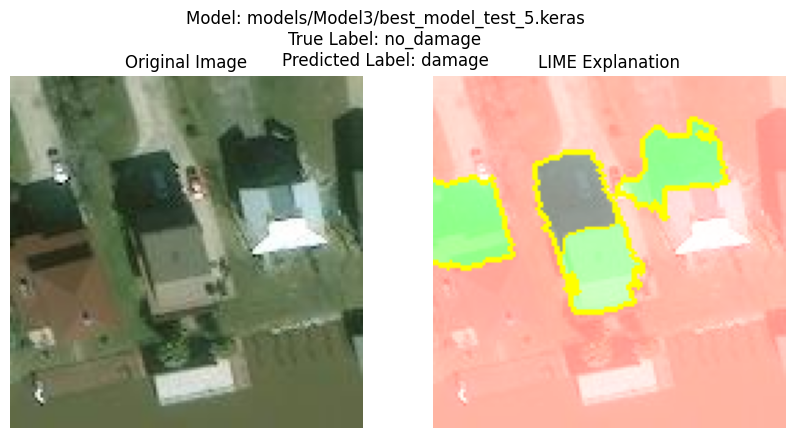

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 9ms/step


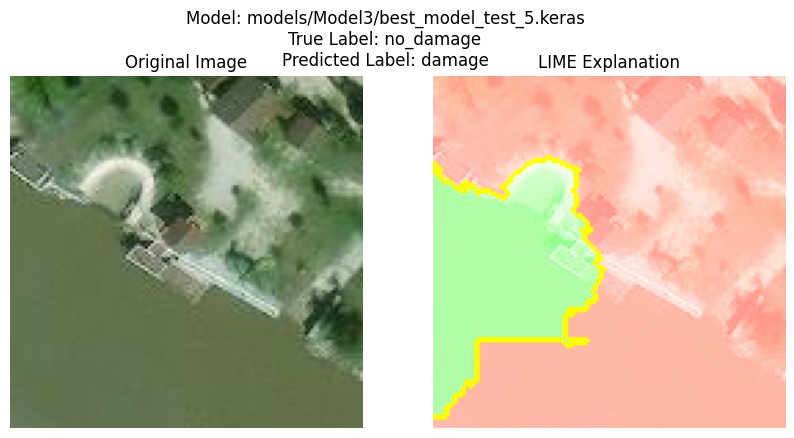

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


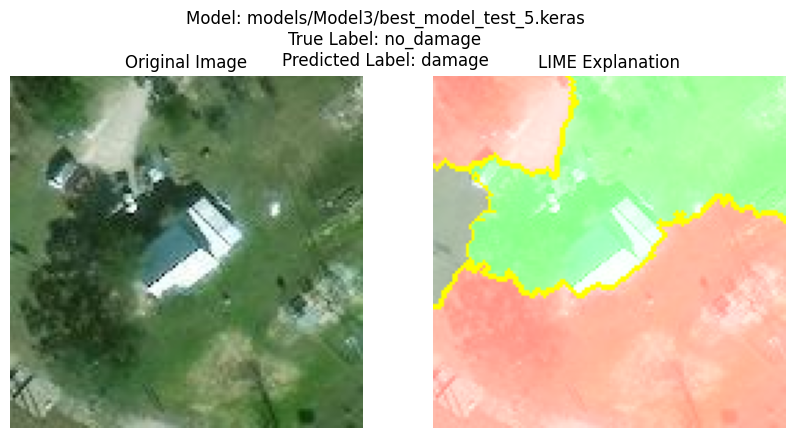

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 14ms/step


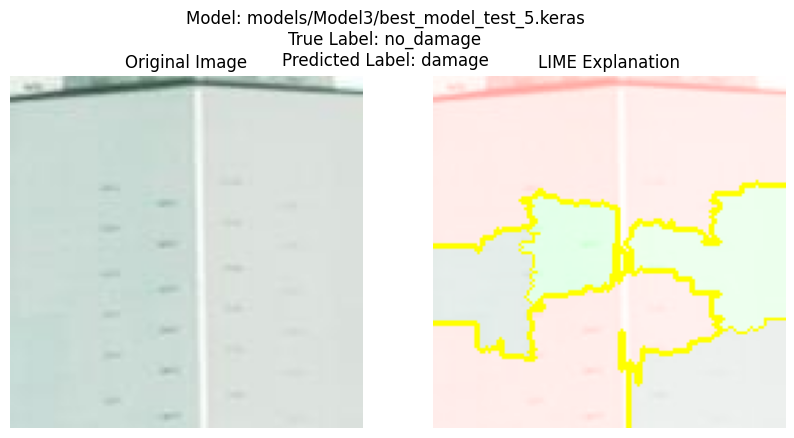

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 14ms/step


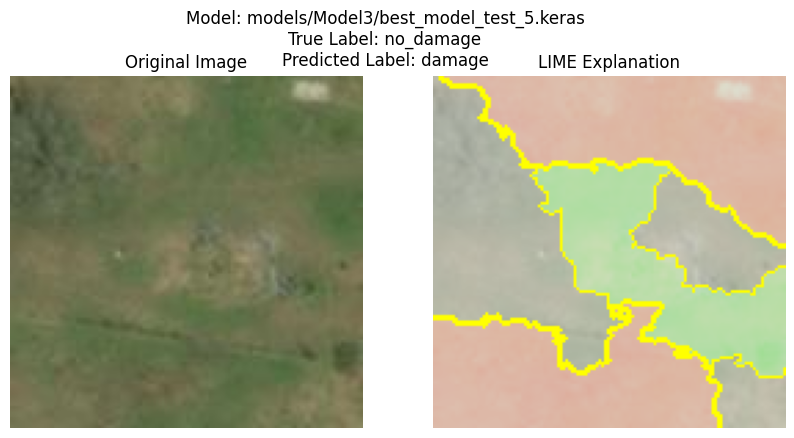

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


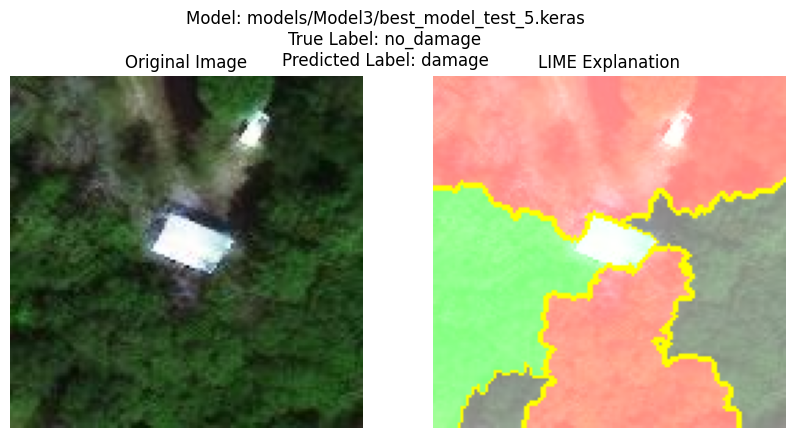

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


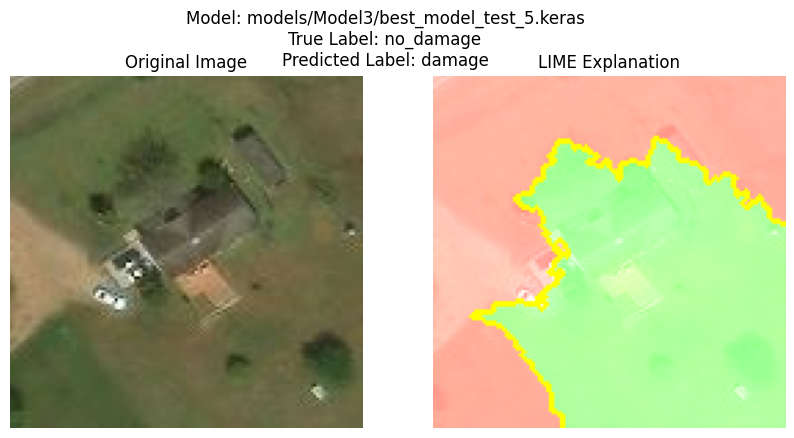

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


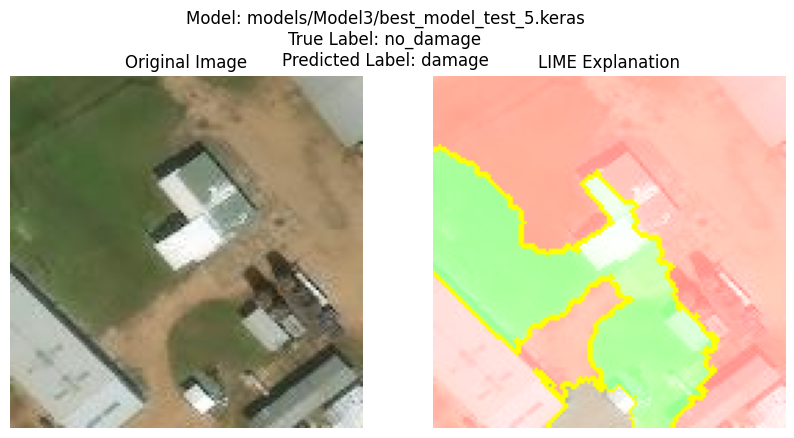

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


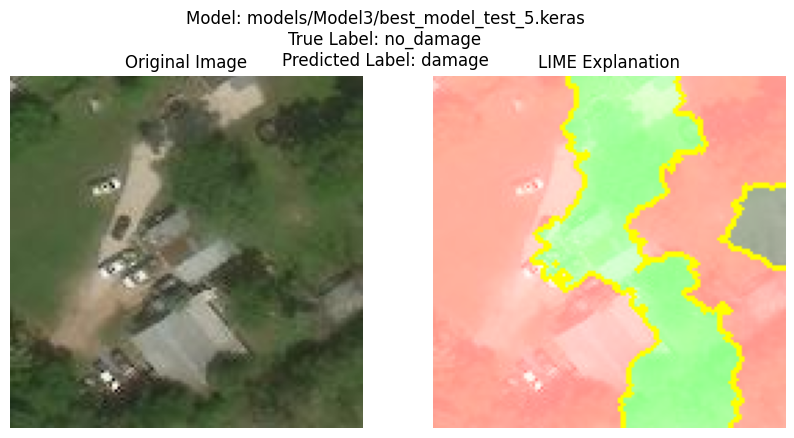

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


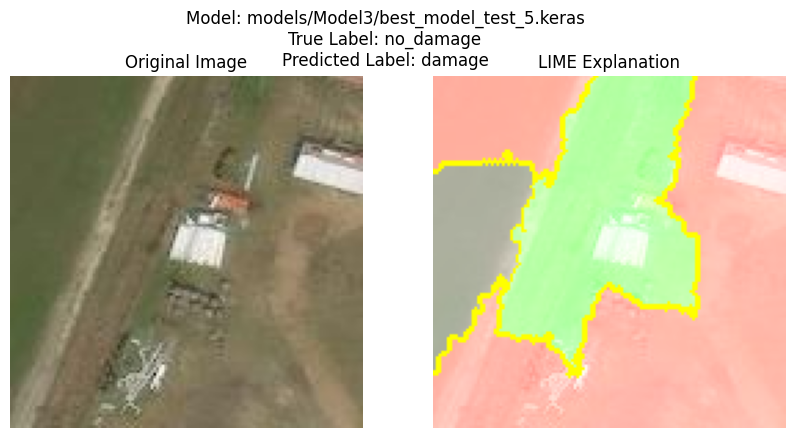

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


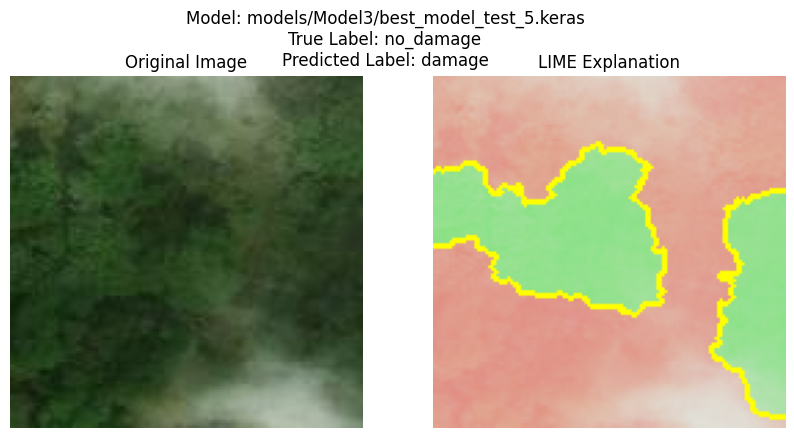

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 52ms/step


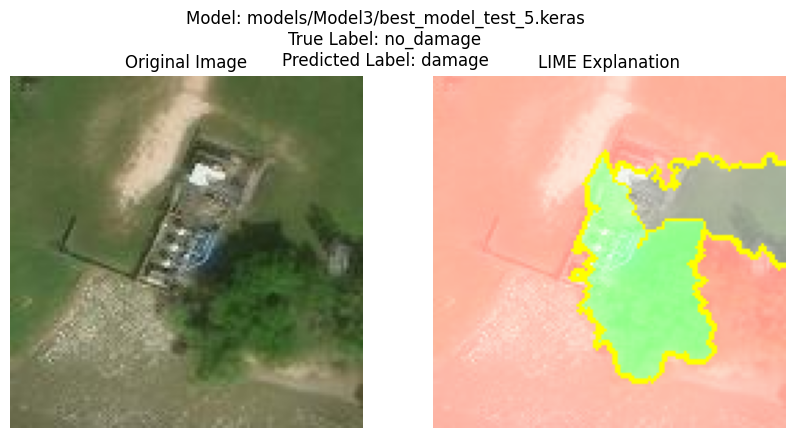

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


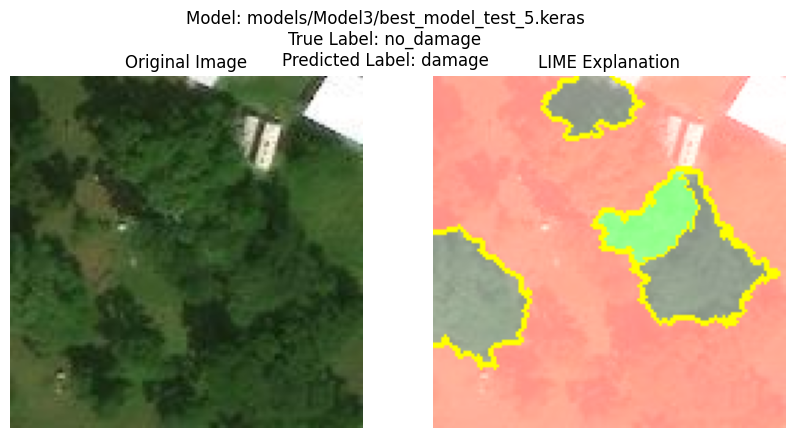

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


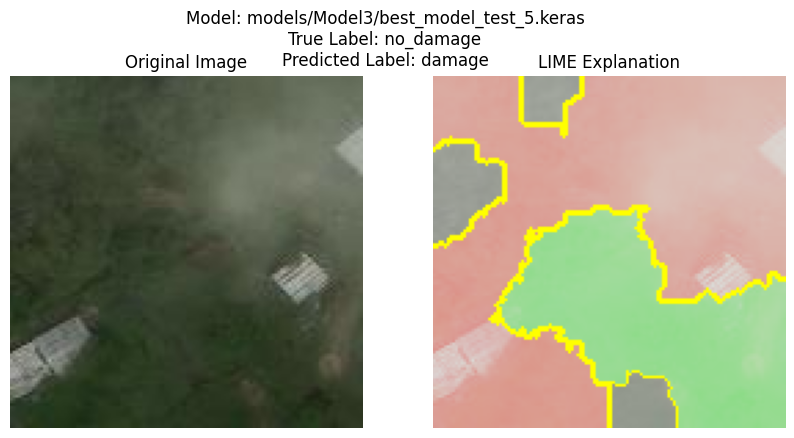

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


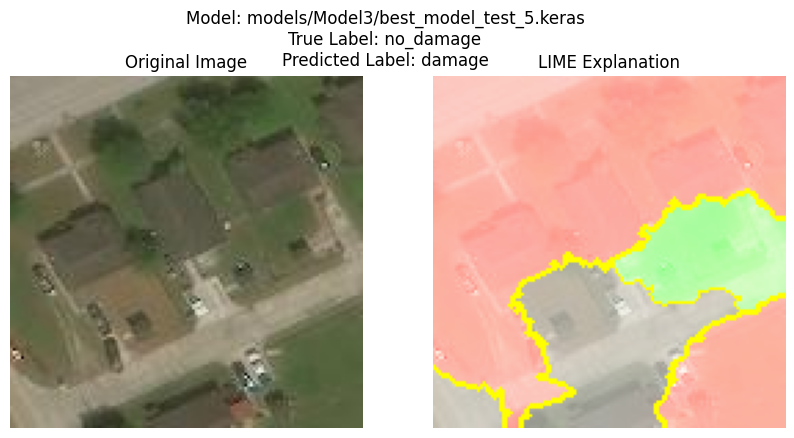

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


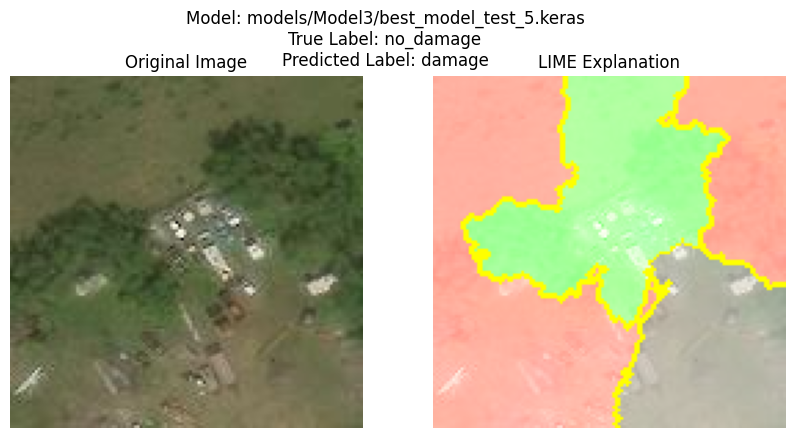

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


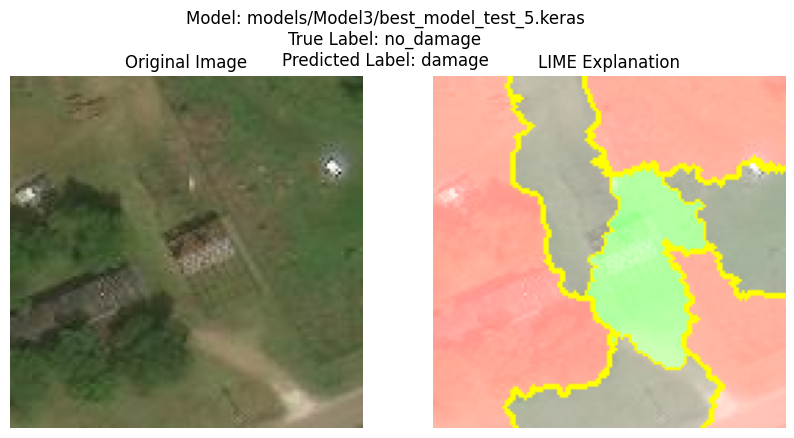

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 9ms/step


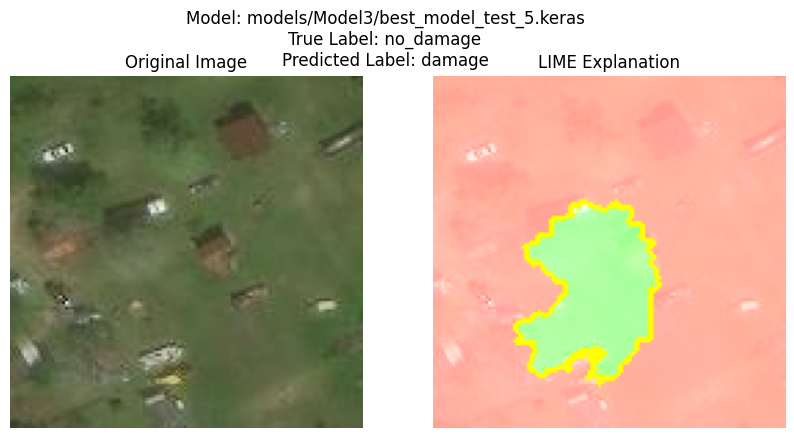

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


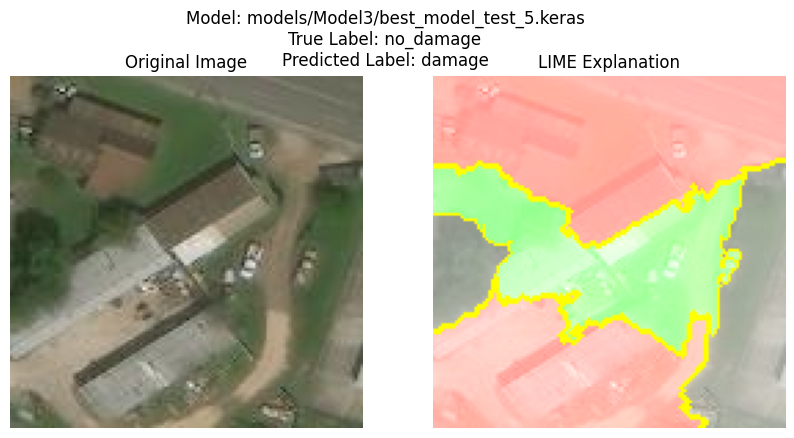

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


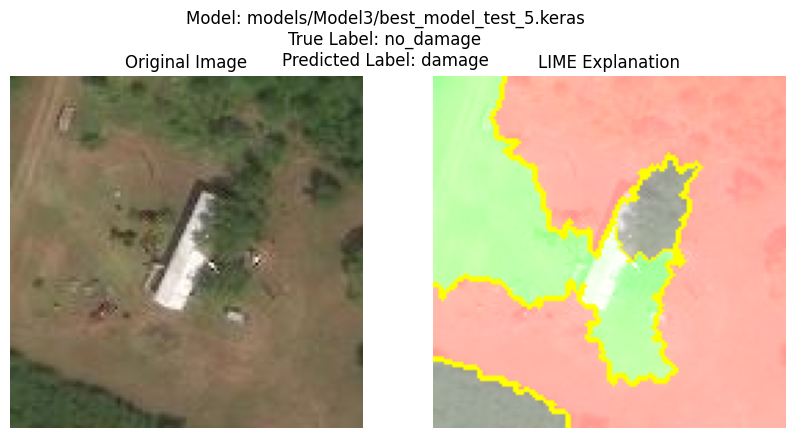

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 15ms/step


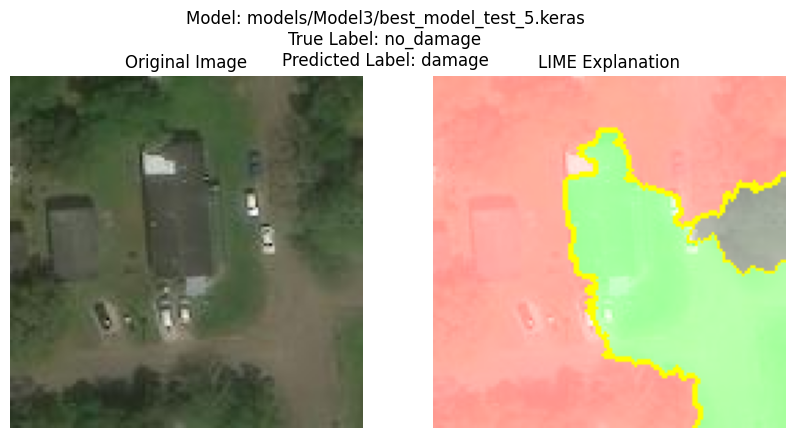

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 14ms/step


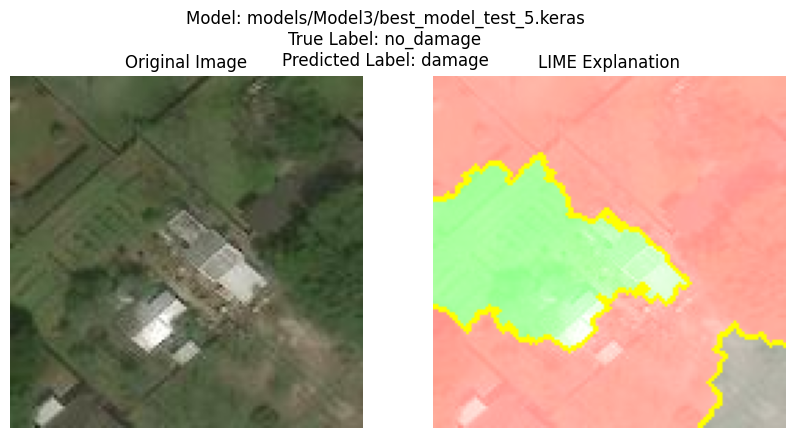

In [163]:
# Function to preprocess an image for prediction
def preprocess_image(image_path):
    img = image.load_img(image_path, target_size=(128, 128))  # Adjust target_size as per your model
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0  # Normalize the image
    return img_array

# Create full paths for each image in the test directory
test_image_paths = [os.path.join(DIR, 'test', image_path) for image_path in fp_list]

# Now test_image_paths contains the full paths to each image in the 'test' directory
print(test_image_paths)

# Example image paths (replace this with your list of image paths)
example_image_paths = test_image_paths  # Adjust the number of images you want to explain

# Load multiple models (replace this with your list of model paths)
model_paths = ['models/Model3/best_model_test_5.keras']

for model_path in model_paths:
    # Load the trained model
    model = load_model(model_path)

    for example_image_path in example_image_paths:
        example_img_array = preprocess_image(example_image_path)

        # Function to explain model prediction using LIME
        def explain_model_prediction(model, img_array, image_path):
            explainer = lime_image.LimeImageExplainer()

            # Explain the instance using the preprocessed image array
            explanation = explainer.explain_instance(img_array[0].astype('double'), model.predict, top_labels=5, num_samples=1000, hide_color=0)

            # Visualize the LIME explanation
            temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

            # Display the original image and LIME explanation side by side
            fig, axs = plt.subplots(1, 2, figsize=(10, 5))

            # Original Image
            img = image.load_img(image_path, target_size=(128, 128))
            axs[0].imshow(img)
            axs[0].axis('off')
            axs[0].set_title('Original Image')

            # LIME Explanation
            axs[1].imshow(mark_boundaries(temp / 2 + 0.5, mask))
            axs[1].axis('off')
            axs[1].set_title('LIME Explanation')
            # Get the true label and predicted label
            true_label = image_df[image_df["path"] == example_image_path]["damage"].values[0]
            predicted_label = "no damage" if model.predict(example_img_array).argmax() == 1 else "damage"

            # Display the model information, true label, and predicted label as a subtitle
            plt.suptitle(f'Model: {model_path}\nTrue Label: {true_label}\nPredicted Label: {predicted_label}')
            plt.show()

        explain_model_prediction(model, example_img_array, example_image_path)


['../Input/satellite-images-of-hurricane-damage/test/damage/-95.075787_29.829223.jpeg', '../Input/satellite-images-of-hurricane-damage/test/damage/-95.075852_29.826931.jpeg', '../Input/satellite-images-of-hurricane-damage/test/damage/-95.077515_29.826657.jpeg', '../Input/satellite-images-of-hurricane-damage/test/damage/-95.078415_29.82913.jpeg', '../Input/satellite-images-of-hurricane-damage/test/damage/-95.087427_29.829728999999997.jpeg', '../Input/satellite-images-of-hurricane-damage/test/damage/-95.087981_29.846421999999997.jpeg', '../Input/satellite-images-of-hurricane-damage/test/damage/-95.089198_29.828795.jpeg', '../Input/satellite-images-of-hurricane-damage/test/damage/-95.101861_29.773584000000003.jpeg', '../Input/satellite-images-of-hurricane-damage/test/damage/-95.17886800000001_30.033008000000002.jpeg', '../Input/satellite-images-of-hurricane-damage/test/damage/-96.866856_28.763201000000002.jpeg', '../Input/satellite-images-of-hurricane-damage/test/damage/-96.933086_28.7275

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


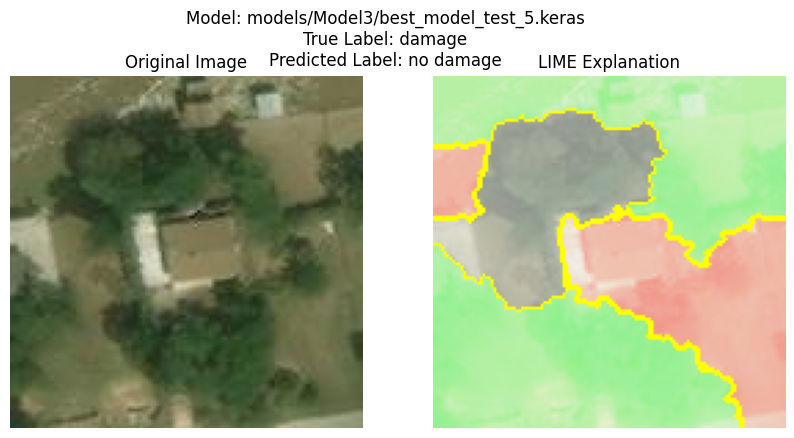

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 9ms/step


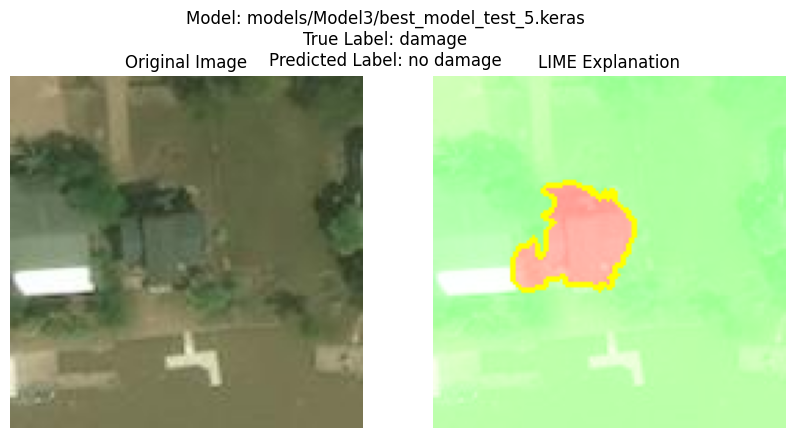

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


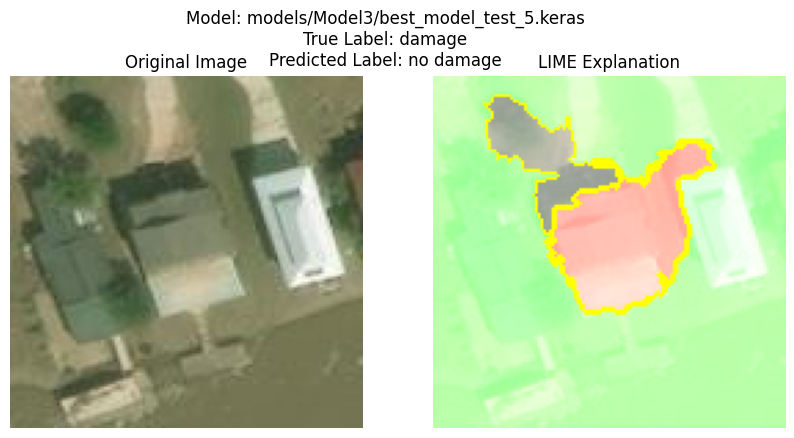

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 14ms/step


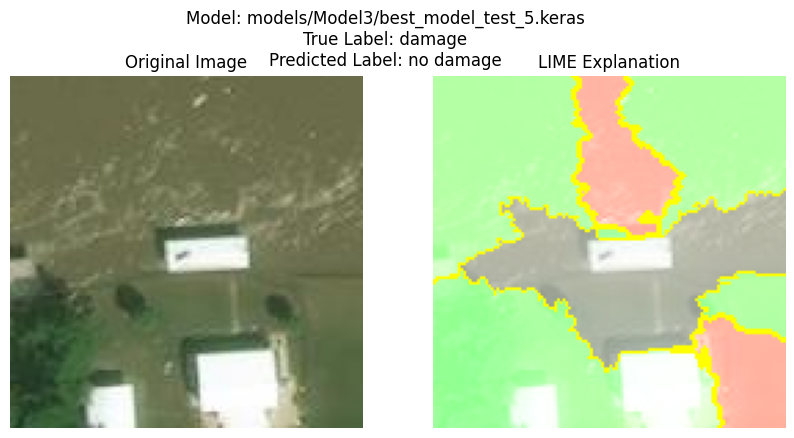

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


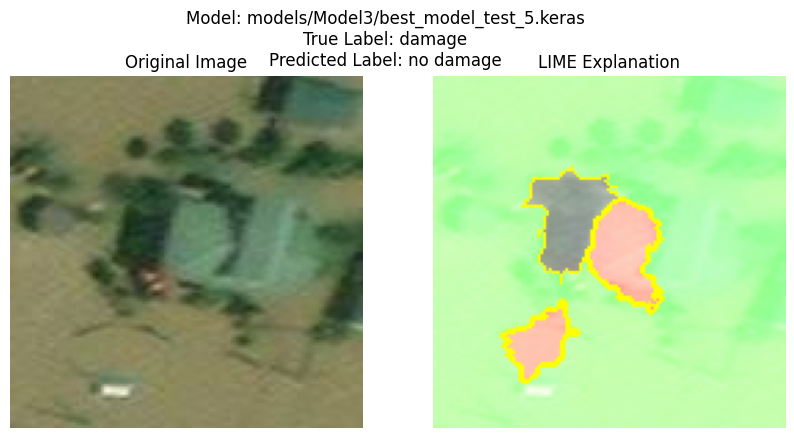

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 10ms/step


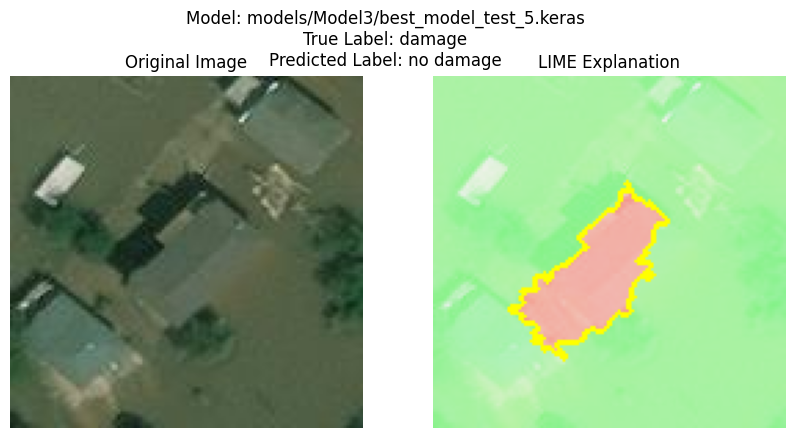

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


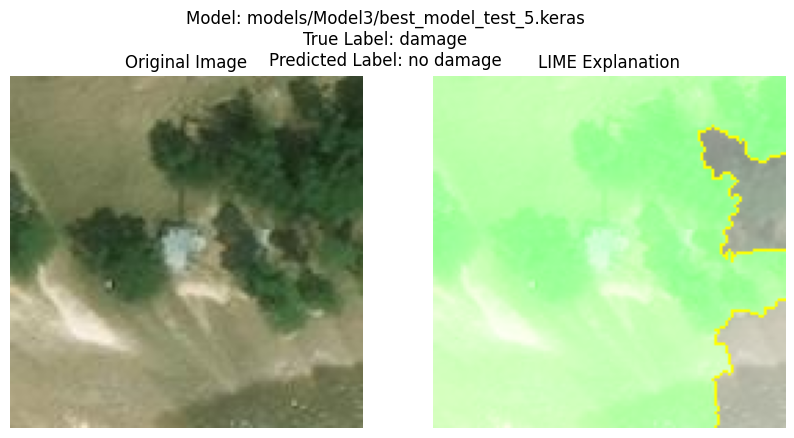

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 13ms/step


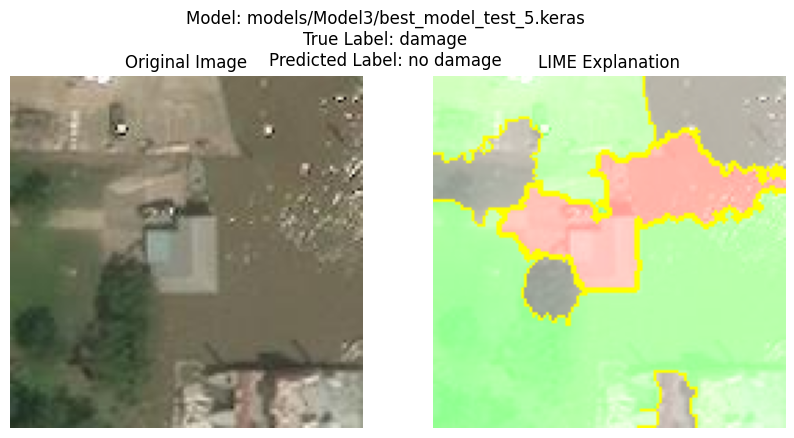

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


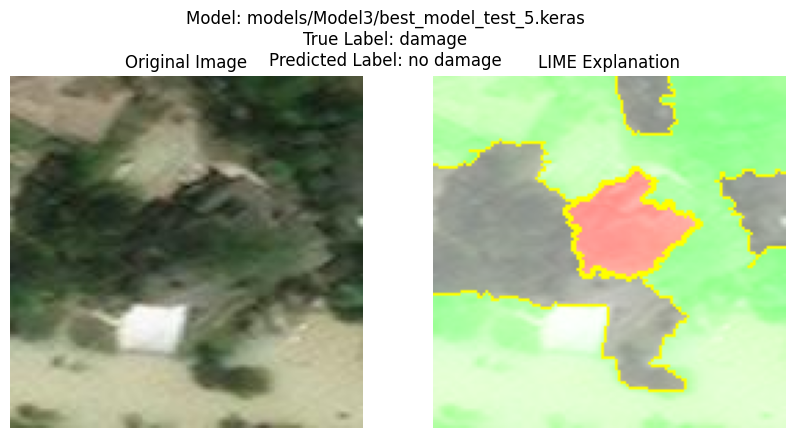

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 14ms/step


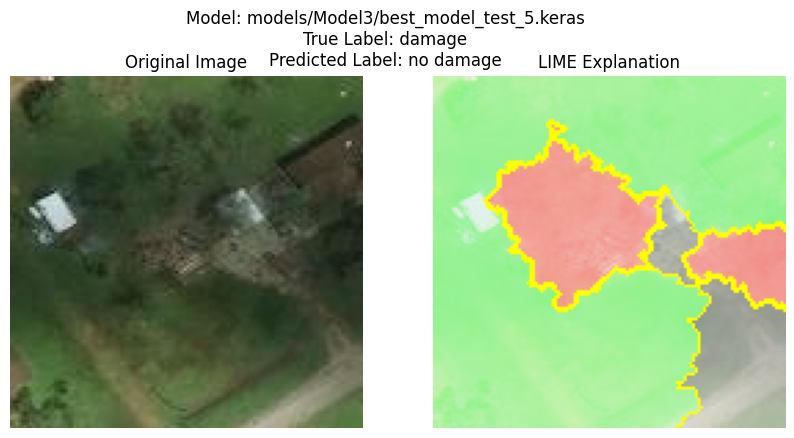

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 68ms/step


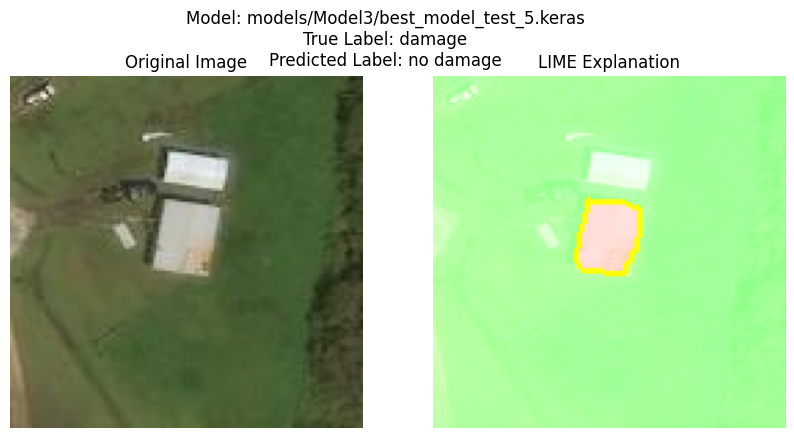

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


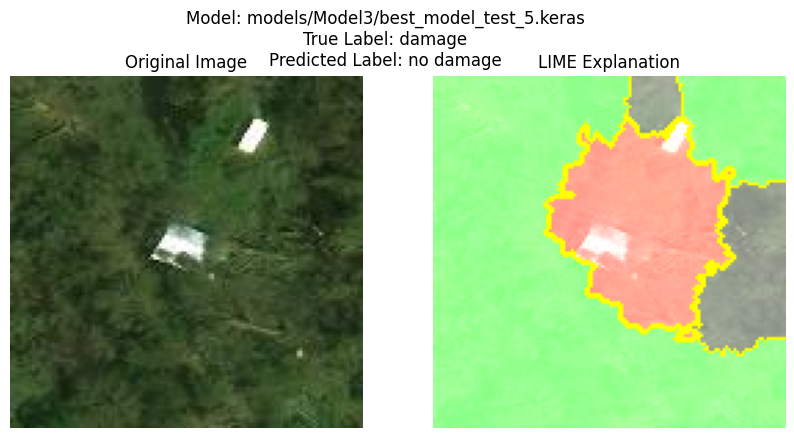

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


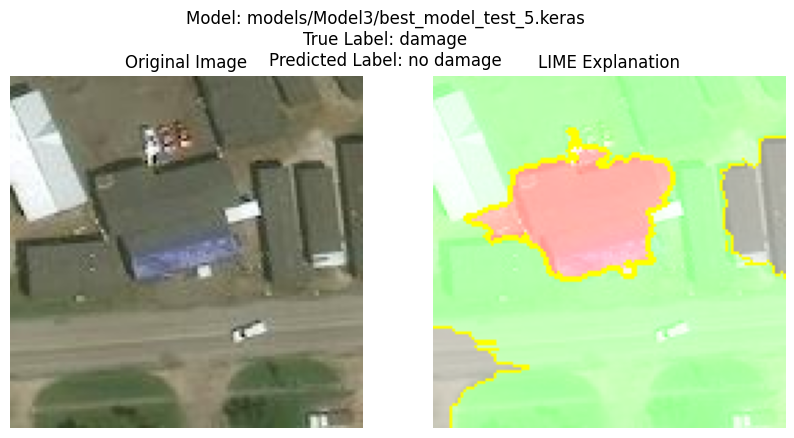

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


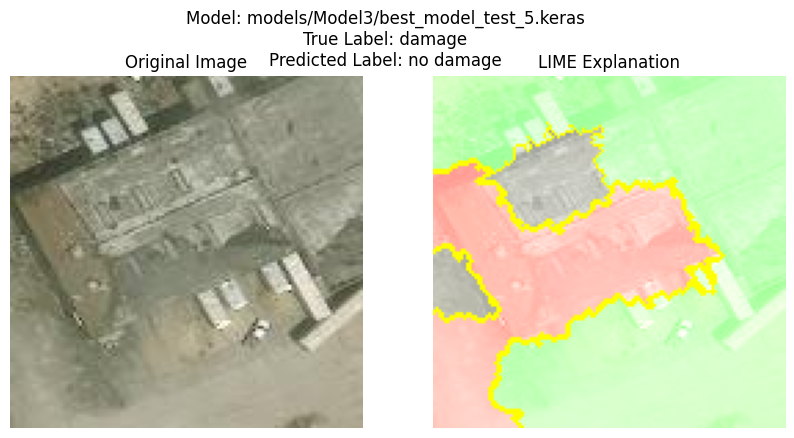

In [164]:
# Function to preprocess an image for prediction
def preprocess_image(image_path):
    img = image.load_img(image_path, target_size=(128, 128))  # Adjust target_size as per your model
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0  # Normalize the image
    return img_array

# Create full paths for each image in the test directory
test_image_paths = [os.path.join(DIR, 'test', image_path) for image_path in fn_list]

# Now test_image_paths contains the full paths to each image in the 'test' directory
print(test_image_paths)

# Example image paths (replace this with your list of image paths)
example_image_paths = test_image_paths  # Adjust the number of images you want to explain

# Load multiple models (replace this with your list of model paths)
model_paths = ['models/Model3/best_model_test_5.keras']

for model_path in model_paths:
    # Load the trained model
    model = load_model(model_path)

    for example_image_path in example_image_paths:
        example_img_array = preprocess_image(example_image_path)

        # Function to explain model prediction using LIME
        def explain_model_prediction(model, img_array, image_path):
            explainer = lime_image.LimeImageExplainer()

            # Explain the instance using the preprocessed image array
            explanation = explainer.explain_instance(img_array[0].astype('double'), model.predict, top_labels=5, num_samples=1000, hide_color=0)

            # Visualize the LIME explanation
            temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

            # Display the original image and LIME explanation side by side
            fig, axs = plt.subplots(1, 2, figsize=(10, 5))

            # Original Image
            img = image.load_img(image_path, target_size=(128, 128))
            axs[0].imshow(img)
            axs[0].axis('off')
            axs[0].set_title('Original Image')

            # LIME Explanation
            axs[1].imshow(mark_boundaries(temp / 2 + 0.5, mask))
            axs[1].axis('off')
            axs[1].set_title('LIME Explanation')
            # Get the true label and predicted label
            true_label = image_df[image_df["path"] == example_image_path]["damage"].values[0]
            predicted_label = "no damage" if model.predict(example_img_array).argmax() == 1 else "damage"

            # Display the model information, true label, and predicted label as a subtitle
            plt.suptitle(f'Model: {model_path}\nTrue Label: {true_label}\nPredicted Label: {predicted_label}')
            plt.show()

        explain_model_prediction(model, example_img_array, example_image_path)


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 81ms/step


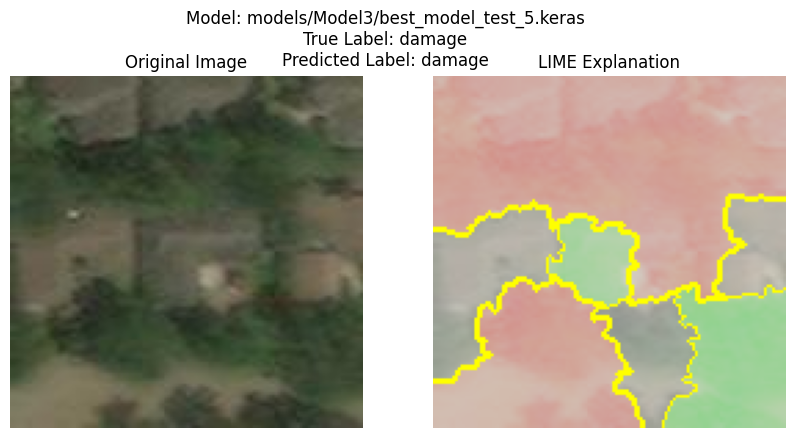

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


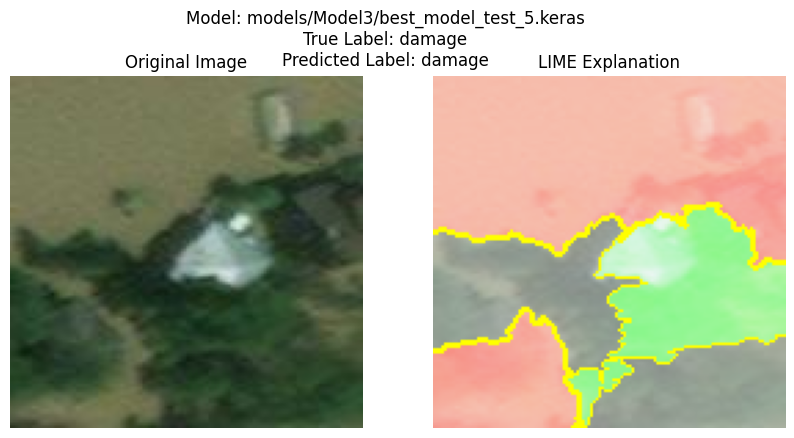

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


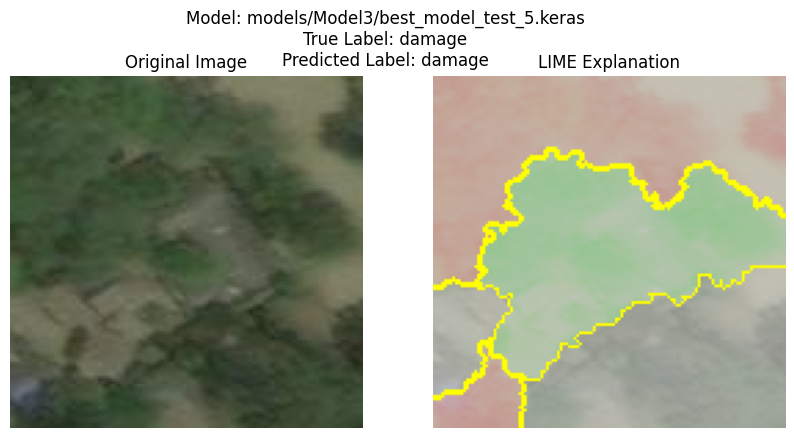

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


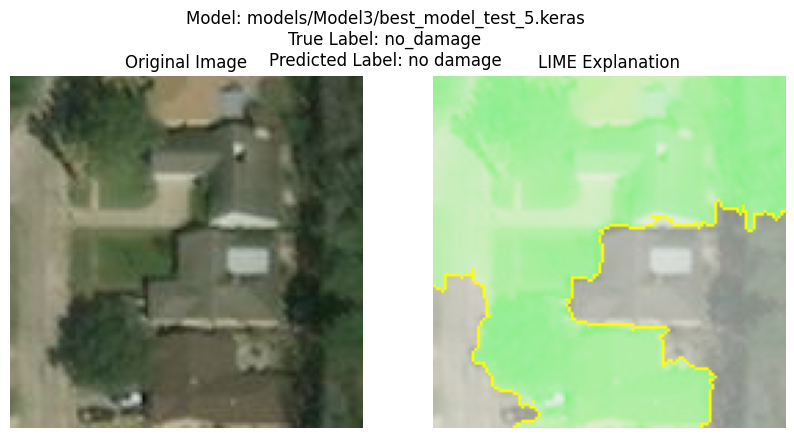

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


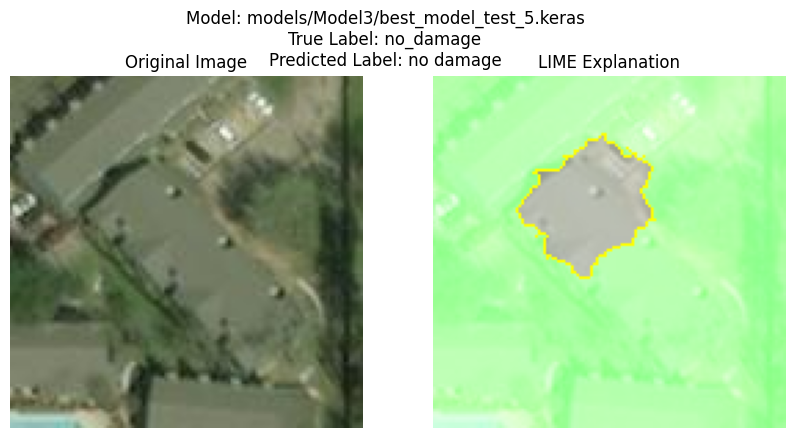

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 50ms/step


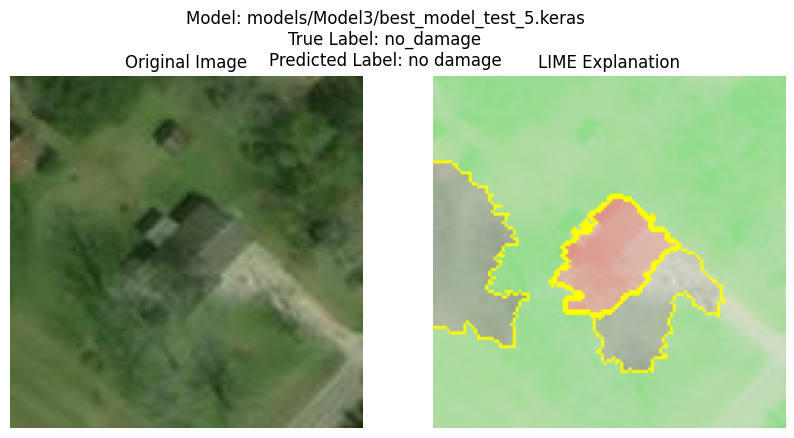

In [150]:
# Function to preprocess an image for prediction
def preprocess_image(image_path):
    img = image.load_img(image_path, target_size=(128, 128))  # Adjust target_size as per your model
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0  # Normalize the image
    return img_array

# Example image paths (replace this with your list of image paths)
example_image_paths = sample_images_df["path"][0:6]  # Adjust the number of images you want to explain

# Load multiple models (replace this with your list of model paths)
model_paths = ['models/Model3/best_model_test_5.keras']

for model_path in model_paths:
    # Load the trained model
    model = load_model(model_path)

    for example_image_path in example_image_paths:
        example_img_array = preprocess_image(example_image_path)

        # Function to explain model prediction using LIME
        def explain_model_prediction(model, img_array, image_path):
            explainer = lime_image.LimeImageExplainer()

            # Explain the instance using the preprocessed image array
            explanation = explainer.explain_instance(img_array[0].astype('double'), model.predict, top_labels=5, num_samples=1000, hide_color=0)

            # Visualize the LIME explanation
            temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

            # Display the original image and LIME explanation side by side
            fig, axs = plt.subplots(1, 2, figsize=(10, 5))

            # Original Image
            img = image.load_img(image_path, target_size=(128, 128))
            axs[0].imshow(img)
            axs[0].axis('off')
            axs[0].set_title('Original Image')

            # LIME Explanation
            axs[1].imshow(mark_boundaries(temp / 2 + 0.5, mask))
            axs[1].axis('off')
            axs[1].set_title('LIME Explanation')
            # Get the true label and predicted label
            true_label = image_df[image_df["path"] == example_image_path]["damage"].values[0]
            predicted_label = "no damage" if model.predict(example_img_array).argmax() == 1 else "damage"

            # Display the model information, true label, and predicted label as a subtitle
            plt.suptitle(f'Model: {model_path}\nTrue Label: {true_label}\nPredicted Label: {predicted_label}')
            plt.show()

        explain_model_prediction(model, example_img_array, example_image_path)


# Testing On Imbalanced Dataset

In [193]:
# load test data
image_size = (128, 128)
batch_size = 32

# specify test image transformations (rescale only)
test_another_datagen = ImageDataGenerator(rescale=1./255)

# test images, with shuffle
test_another_generator = test_another_datagen.flow_from_directory(
        test_another_path,
        target_size=image_size,
        batch_size=batch_size,
        class_mode='binary')

#test images, no shuffle (so results can be matched to image filenames)
test_another_generator_noshuff = test_another_datagen.flow_from_directory(
        test_another_path,
        target_size=image_size,
        batch_size=batch_size,
        shuffle=False,
        class_mode='binary')

Found 9000 images belonging to 2 classes.
Found 9000 images belonging to 2 classes.


1/1 [==============================] - 0s 41ms/step


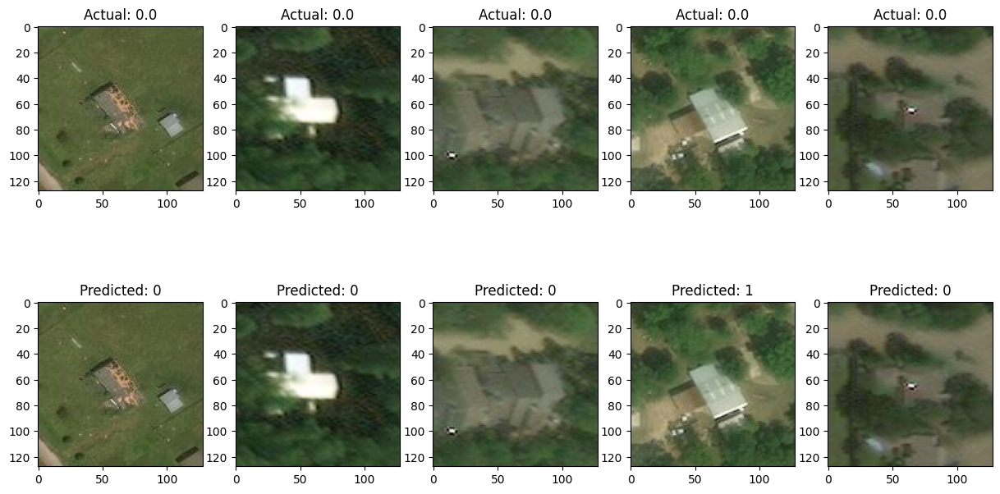

In [195]:
# Plot images and predictions
plot_images_with_predictions(best_model, test_another_generator, num_images=5)

282/282 [==============================] - 7s 23ms/step


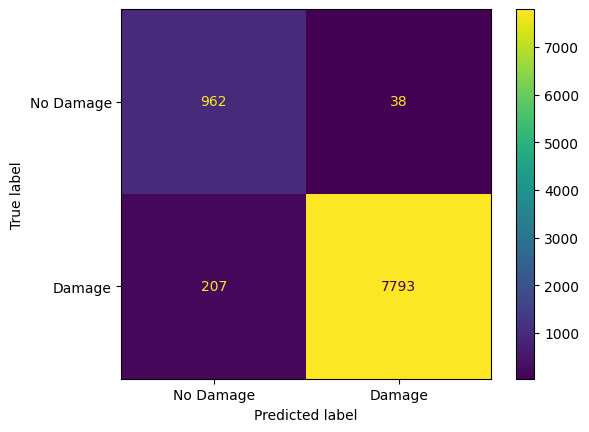

In [214]:
missclass_df, true, pred = find_missclassed_images(best_model,test_another_generator_noshuff)

# Confusion matrix
cm = confusion_matrix(true, pred)

# Display confusion matrix with 0 as "No Damage" and 1 as "Damage"
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Damage', 'Damage']).plot(values_format='d')
plt.show()

282/282 [==============================] - 6s 20ms/step


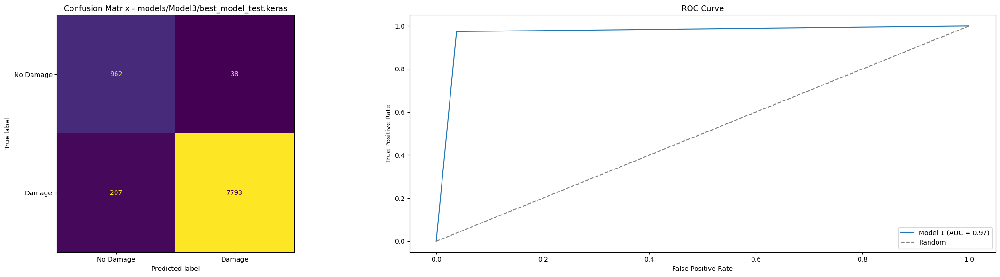

In [213]:
# Load multiple models
model_paths = ['models/Model3/best_model_test.keras']

# Plot confusion matrices and ROC curves in a single subplot
num_models = len(model_paths)

fig, axs = plt.subplots(1, num_models + 1, figsize=(12 * (num_models + 1), 6))

if num_models == 1:
    axs = [axs]  # Wrap the single Axes object in a list for consistent indexing

for i, model_path in enumerate(model_paths):
    best_model = load_model(model_path)
    eval_results = best_model.evaluate(x=test_another_generator, verbose=1)
    missclass_df, true, pred = find_missclassed_images(best_model,test_another_generator_noshuff)
    
    # Append results to the list
    results_list.append({
        'Model': model_path,
        'Confusion Matrix': confusion_matrix(true, pred),
        'Misclassified Images': missclass_df
    })
    
    # Plot confusion matrix in the corresponding subplot
    ax = axs[0][i]
    
    cm = confusion_matrix(true, pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Damage', 'Damage'])
    
    # Plot the confusion matrix
    disp.plot(ax=ax, values_format='d', colorbar=False)
    ax.set_title(f"Confusion Matrix - {model_path}")

    # Plot ROC curve in a new subplot
    ax_roc = axs[0][num_models]
    fpr, tpr, _ = roc_curve(true, pred)
    roc_auc = auc(fpr, tpr)
    
    ax_roc.plot(fpr, tpr, label=f'Model {i + 1} (AUC = {roc_auc:.2f})')
    ax_roc.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
    ax_roc.set_xlabel('False Positive Rate')
    ax_roc.set_ylabel('True Positive Rate')
    ax_roc.set_title('ROC Curve')
    ax_roc.legend()

# Adjust layout
plt.tight_layout()
plt.show()


In [204]:
model = load_model('models/Model3/best_model_test_5.keras')
# Create a list to store results
results_list = []

# Loop through each model

eval_results = model.evaluate(x=test_another_generator, verbose=1)
missclass_df, true, pred = find_missclassed_images(model,test_another_generator_noshuff)

# Append results to the list
results_list.append({
    'Model': model_path,
    'Accuracy': accuracy_score(true, pred),
    'Precision': precision_score(true, pred),
    'Recall': recall_score(true, pred),
    'True Positive Rate (Sensitivity)': recall_score(true, pred),
    'False Positive Rate': confusion_matrix(true, pred)[0, 1] / (confusion_matrix(true, pred)[0, 1] + confusion_matrix(true, pred)[0, 0])
})

# Create a DataFrame from the results
results_df = pd.DataFrame(results_list)

# Print or use the DataFrame as needed
print(results_df)


282/282 [==============================] - 9s 30ms/step
                                   Model  Accuracy  Precision    Recall  \
0  models/Model3/best_model_test_5.keras  0.975333    0.99554  0.976625   

   True Positive Rate (Sensitivity)  False Positive Rate  
0                          0.976625                0.035  
